# Import Libraries used in this notebook

In [1]:
# Get Files
import pandas as pd 
import glob 

# Process Data
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Exploratory Analysis
from IPython.display import Video
from pandas.plotting import parallel_coordinates
import altair as alt
import datashader as ds
from datashader import transfer_functions as tf
from datashader.utils import lnglat_to_meters
from colorcet import fire
import holoviews as hv
from holoviews.element.tiles import EsriImagery
from holoviews.operation.datashader import datashade


# Flight Paths
from gcmap import GCMapper, Gradient
import plotly.graph_objects as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.express as px
import os
import moviepy
import moviepy.video.io.ImageSequenceClip
from IPython.display import Video
from pandas.plotting import parallel_coordinates
import altair as alt
from PIL import Image, ImageDraw, ImageFont

In [2]:
#alt.renderers.enable('jupyterlabs')
alt.renderers.enable('default')

RendererRegistry.enable('default')

# Get Files

After downloading the files from Flight Radar 24 into the **Raw_File** folder, proceed with the following to combine the data set into one file

In [3]:
csv = glob.glob('../raw_files/*.csv')

In [4]:
%%time
n = 1

for i in csv:
    load = pd.read_csv(i)
    date = pd.to_datetime(i.split('_')[3], format='%Y%m%d').date()
    load['date'] = date
    
    try:
        df = df.append(load)    
    except:       
        df = load.copy()
    
    print(len(df)," file: ",i ,n)            
    n = n+1

182377  file:  ../raw_files/2020_01_20200107_flights.csv 1
356870  file:  ../raw_files/2020_01_20200114_flights.csv 2
548541  file:  ../raw_files/2020_01_20200121_flights.csv 3
728351  file:  ../raw_files/2020_01_20200128_flights.csv 4
907054  file:  ../raw_files/2020_02_20200203_flights.csv 5
1068592  file:  ../raw_files/2020_02_20200210_flights.csv 6
1242344  file:  ../raw_files/2020_02_20200217_flights.csv 7
1416441  file:  ../raw_files/2020_02_20200224_flights.csv 8
1592099  file:  ../raw_files/2020_03_20200303_flights.csv 9
1762458  file:  ../raw_files/2020_03_20200310_flights.csv 10
1910579  file:  ../raw_files/2020_03_20200317_flights.csv 11
2006722  file:  ../raw_files/2020_03_20200324_flights.csv 12
2081325  file:  ../raw_files/2020_03_20200331_flights.csv 13
2149720  file:  ../raw_files/2020_04_20200407_flights.csv 14
2215567  file:  ../raw_files/2020_04_20200414_flights.csv 15
2284517  file:  ../raw_files/2020_04_20200421_flights.csv 16
2358617  file:  ../raw_files/2020_04_2

In [5]:
len(df)

3635876

In [6]:
df.head()

,flight_id,aircraft_id,reg,equip,callsign,flight,schd_from,schd_to,real_to,reserved,date
0,594388892,5313492,NaN,NaN,VARU2,NaN,TLL,NaN,NaN,NaN,2020-01-07
1,594386062,3948711,NaN,GRND,LEOS12,NaN,NaN,NaN,NaN,NaN,2020-01-07
2,594344731,4958537,TCJJI,B77W,THY057D,NaN,CGK,IST,IST,NaN,2020-01-07
3,594365436,12706822,NaN,GRND,SER378,NaN,YUL,NaN,NaN,NaN,2020-01-07
4,594375391,8390781,FOLLOWME6,GRND,FOLOWME6,NaN,NaN,NaN,NaN,NaN,2020-01-07


In [7]:
# Save Dataset for working with in the future

df.to_csv('../2020_tuesday_flights.csv', index = False)

# Process Data

The following is information provided by FlightRadar24 regarding their dataset

Flights.csv

* flight_id = Unique ID generated by Flightradar24 for each flight
* aircraft_id = The aircraft’s unique ICAO 24-bit address in decimal format
* reg = The aircraft’s normalized registration
* equip = The aircraft ICAO type code
* callsign = Call sign broadcast by aircraft, e.g. BAW1VR
* flight = Flight number, e.g. BA123
* schd_from = Scheduled departure airport’s IATA code
* schd_to = Scheduled destination airport’s IATA code
* real_to = IATA code of where the flight landed (may be different from schd_to in cases of diversion, return)
* reserved = unused field, can be ignored.

In [8]:
#Read Data in 
df = pd.read_csv('../2020_tuesday_flights.csv') ### Change this location to current location 

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3635876 entries, 0 to 3635875
Data columns (total 11 columns):
 #   Column       Dtype  
---  ------       -----  
 0   flight_id    int64  
 1   aircraft_id  int64  
 2   reg          object 
 3   equip        object 
 4   callsign     object 
 5   flight       object 
 6   schd_from    object 
 7   schd_to      object 
 8   real_to      object 
 9   reserved     float64
 10  date         object 
dtypes: float64(1), int64(2), object(8)
memory usage: 305.1+ MB


In [10]:
df.head()

,flight_id,aircraft_id,reg,equip,callsign,flight,schd_from,schd_to,real_to,reserved,date
0,594388892,5313492,NaN,NaN,VARU2,NaN,TLL,NaN,NaN,NaN,2020-01-07
1,594386062,3948711,NaN,GRND,LEOS12,NaN,NaN,NaN,NaN,NaN,2020-01-07
2,594344731,4958537,TCJJI,B77W,THY057D,NaN,CGK,IST,IST,NaN,2020-01-07
3,594365436,12706822,NaN,GRND,SER378,NaN,YUL,NaN,NaN,NaN,2020-01-07
4,594375391,8390781,FOLLOWME6,GRND,FOLOWME6,NaN,NaN,NaN,NaN,NaN,2020-01-07


In [11]:
# pair down to columns needed 
flights = df[['flight_id','flight','schd_from','schd_to','real_to','date']]

In [12]:
flights.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3635876 entries, 0 to 3635875
Data columns (total 6 columns):
 #   Column     Dtype 
---  ------     ----- 
 0   flight_id  int64 
 1   flight     object
 2   schd_from  object
 3   schd_to    object
 4   real_to    object
 5   date       object
dtypes: int64(1), object(5)
memory usage: 166.4+ MB


In [13]:
flights.head(10)

,flight_id,flight,schd_from,schd_to,real_to,date
0,594388892,NaN,TLL,NaN,NaN,2020-01-07
1,594386062,NaN,NaN,NaN,NaN,2020-01-07
2,594344731,NaN,CGK,IST,IST,2020-01-07
3,594365436,NaN,YUL,NaN,NaN,2020-01-07
4,594375391,NaN,NaN,NaN,NaN,2020-01-07
5,594387645,AIR10,DXB,NaN,NaN,2020-01-07
6,594386833,NaN,NaN,NaN,NaN,2020-01-07
7,594373346,NaN,NaN,NaN,NaN,2020-01-07
8,594382794,NaN,NaN,NaN,NaN,2020-01-07
9,594394980,CX840,HKG,JFK,JFK,2020-01-07


In [14]:
# Save file for future use
flights.to_csv('../2020_tuesday_flights_agg.csv', index = False)

# Exploratory Analysis on Flights Only Data

In [3]:
#Read Data in 
df = pd.read_csv('../2020_tuesday_flights_agg.csv')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3635876 entries, 0 to 3635875
Data columns (total 6 columns):
 #   Column     Dtype 
---  ------     ----- 
 0   flight_id  int64 
 1   flight     object
 2   schd_from  object
 3   schd_to    object
 4   real_to    object
 5   date       object
dtypes: int64(1), object(5)
memory usage: 166.4+ MB


In [5]:
df.head()

,flight_id,flight,schd_from,schd_to,real_to,date
0,594388892,NaN,TLL,NaN,NaN,2020-01-07
1,594386062,NaN,NaN,NaN,NaN,2020-01-07
2,594344731,NaN,CGK,IST,IST,2020-01-07
3,594365436,NaN,YUL,NaN,NaN,2020-01-07
4,594375391,NaN,NaN,NaN,NaN,2020-01-07


In [6]:
# Calculate total number of flights each day that start at the same point and have the same destination
flight_trip_date_agg = pd.DataFrame(df.groupby(['schd_from','schd_to','date']).size().reset_index(name="Total")
                   .sort_values(by='Total', ascending=False).reset_index(drop=True))

In [7]:
flight_trip_date_agg.head(10)

,schd_from,schd_to,date,Total
0,GFK,GFK,2020-07-14,251
1,GFK,GFK,2020-07-07,251
2,GFK,GFK,2020-06-23,230
3,DVT,DVT,2020-06-02,175
4,GFK,GFK,2020-03-10,173
5,DAB,DAB,2020-06-09,171
6,DVT,DVT,2020-06-30,157
7,SFB,SFB,2020-01-07,153
8,SFB,SFB,2020-07-21,149
9,DVT,DVT,2020-07-07,148


In [8]:
flight_trip_date_agg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 973009 entries, 0 to 973008
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   schd_from  973009 non-null  object
 1   schd_to    973009 non-null  object
 2   date       973009 non-null  object
 3   Total      973009 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 29.7+ MB


In [9]:
# Calculate total number of flights by date
flight_date_agg = pd.DataFrame(df.groupby(['date']).size().reset_index(name="Total")
                   .reset_index(drop=True))
flight_date_agg.set_index('date', inplace=True)

In [10]:
flight_date_agg.head(10)

,Total
date,
2020-01-07,182377
2020-01-14,174493
2020-01-21,191671
2020-01-28,179810
2020-02-03,178703
2020-02-10,161538
2020-02-17,173752
2020-02-24,174097
2020-03-03,175658


Text(0,0.5,'# of Flights')

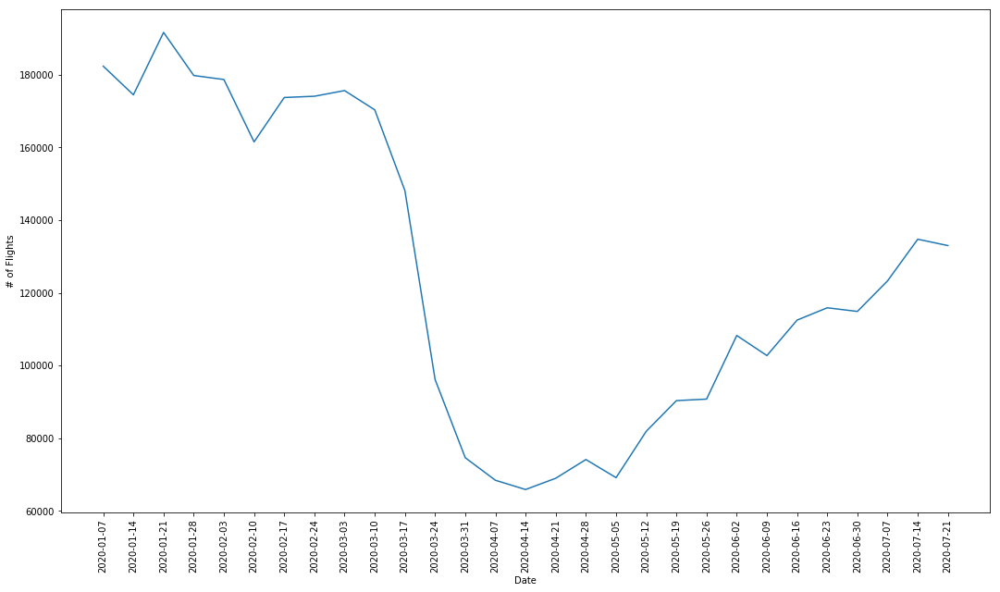

In [11]:
# Plot flights by date
plt.figure(figsize=(18,10))
plt.xticks(rotation='vertical')
plt.plot(flight_date_agg)
plt.xlabel("Date")
plt.ylabel("# of Flights")

In [12]:
# Save Dataset
flight_trip_date_agg.to_csv('../flight_trip_date_agg.csv', index = False)

# Airport Data

In this section we load the airport data set from Openflights (https://openflights.org/data.html)

In [2]:
#Read Data in from previous step
df = pd.read_csv('../flight_trip_date_agg.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 973009 entries, 0 to 973008
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   schd_from  973009 non-null  object
 1   schd_to    973009 non-null  object
 2   date       973009 non-null  object
 3   Total      973009 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 29.7+ MB


In [4]:
# Load Airport Data
airports = pd.read_csv('../airports.dat', usecols=[1, 3,4, 6, 7], 
                       names=['name','country', 'code', 'latitude', 'longitude' ],
                      dtype={'latitude':"float32",'longitude':"float32"})

In [5]:
# Join with flights data on scheduled from aports
full = pd.merge(df, airports, left_on='schd_from', right_on='code')
full.rename(columns={"country": "from_country", "code": "from_code", "latitude": "from_latitude","longitude":"from_longitude"}, inplace = True)

# Join with flights data on scheduled to aports
final = pd.merge(full, airports, left_on='schd_to', right_on='code')
final.rename(columns={"country": "to_country", "code": "to_code", "latitude": "to_latitude", "longitude":"to_longitude"}, inplace = True)

#Drop the flights that take off and land at the same airport
flight_df = final[final['schd_from'] != final['schd_to']] 
flight_df.drop(columns=['to_country','from_country','to_code','from_code','name_x','name_y'],inplace=True)
flight_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 883589 entries, 28 to 911816
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   schd_from       883589 non-null  object 
 1   schd_to         883589 non-null  object 
 2   date            883589 non-null  object 
 3   Total           883589 non-null  int64  
 4   from_latitude   883589 non-null  float32
 5   from_longitude  883589 non-null  float32
 6   to_latitude     883589 non-null  float32
 7   to_longitude    883589 non-null  float32
dtypes: float32(4), int64(1), object(3)
memory usage: 47.2+ MB


/Users/user/anaconda3/envs/dviz/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



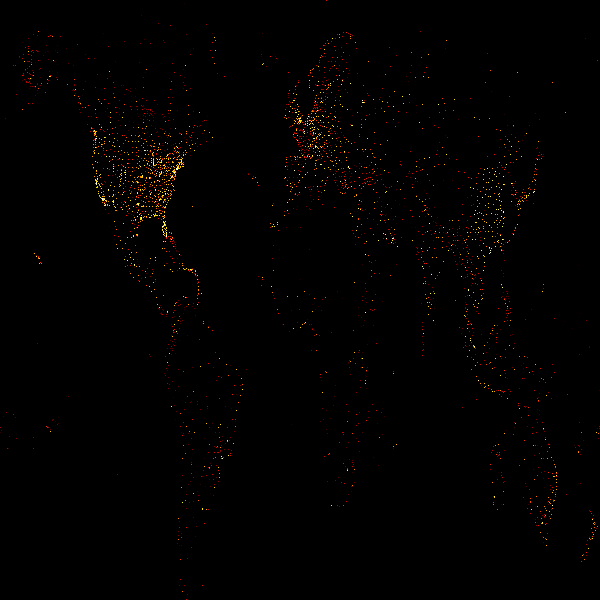

In [6]:
agg = ds.Canvas().points(final, 'to_longitude', 'to_latitude')
tf.set_background(tf.shade(agg, cmap=fire), "black")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
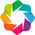

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [to_longitude,to_latitude]   (R,G,B,A)

In [7]:

hv.extension('bokeh')

map_tiles  = EsriImagery().opts(alpha=0.5, width=900, height=480, bgcolor='black')
final.loc[:, 'to_longitude'], final.loc[:, 'to_latitude'] = lnglat_to_meters(final.to_longitude,final.to_latitude)

points     = hv.Points(final, ['to_longitude', 'to_latitude'])
arrivals = datashade(points, x_sampling=1, y_sampling=1, cmap=fire, width=900, height=480)

map_tiles * arrivals

In [8]:
# Create map of the world with all the airports

ports = []
ports.append(dict(
                type = 'scattergeo',
                locationmode = 'ISO-3',
                showlegend = False,
                lon = airports['longitude'],
                lat = airports['latitude'],
                hoverinfo = 'text',
                text = airports['name'],
                mode = 'markers',
                marker = dict(
                    size=2,
                    color='blue',
                    
                ))
        )

layout = dict(
        title = dict(
            text='Airports of the World', 
            x=0.5,
            font = dict(
            size = 22,
            ),
        ),
        showlegend = False,
        dragmode = False,
        geo = dict(
            scope='world',
            projection=dict( type='natural earth' ),
            showland = True,
            showocean = True,
            showcoastlines = True,
            coastlinecolor = 'black', 
            coastlinewidth = .7,
            landcolor = 'white',
            countrycolor = 'rgb(204, 204, 204)',
            oceancolor='white',
            lakecolor='white',
        ),
    )

# Create the figure to be plotted
fig = dict( data=ports, layout=layout )
iplot(fig)

In [9]:
plot(fig)

'temp-plot.html'

# Exploratory Analysis

In [10]:
covid_cntry = ('United States','China','India','Germany','Italy','Spain','Brazil','Russia','South Korea',\
               'Singapore','United Kingdom','France')

top = flight_df.groupby(['schd_from','date'])[['Total']].agg('sum').reset_index().sort_values(by = 'Total', ascending=False)

top_df = pd.merge(top, airports, left_on='schd_from', right_on='code')

cntry_date_df = top_df.groupby(['country','date'])[['Total']].agg('sum').reset_index()\
                .sort_values(by = ['date','Total'])
covid_cntry_df = cntry_date_df.loc[cntry_date_df['country'].isin(covid_cntry)]

In [11]:
covid_cntry_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 348 entries, 4767 to 5620
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   country  348 non-null    object
 1   date     348 non-null    object
 2   Total    348 non-null    int64 
dtypes: int64(1), object(2)
memory usage: 10.9+ KB


In [12]:
covid_cntry_df.head()

,country,date,Total
4767,Singapore,2020-01-07,621
4917,South Korea,2020-01-07,1391
2719,Italy,2020-01-07,1819
1868,France,2020-01-07,2164
4969,Spain,2020-01-07,2321


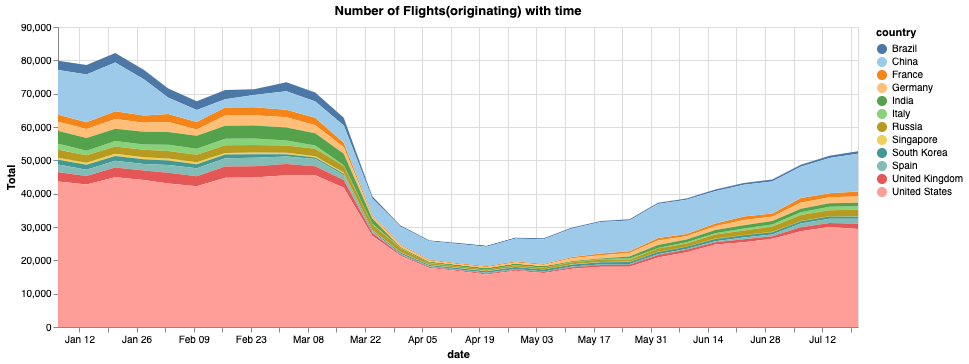

In [13]:
alt.Chart(covid_cntry_df).mark_area().encode(
    x="date:T",
    y="Total:Q",
    #color="country:N"
    color=alt.Color('country', scale=alt.Scale(scheme='tableau20'))
).properties(width=800,title='Number of Flights(originating) with time')

In [14]:
top = flight_df.groupby(['schd_from'])[['Total']].agg('sum').reset_index().sort_values(by = 'Total', ascending=False).head(75)
top_air = top['schd_from']
top_df = flight_df.loc[flight_df['schd_from'].isin(top_air)]
top_df = top_df.groupby(['schd_from','date'])[['Total']].agg('sum').reset_index()
top_75_df = pd.merge(top_df, airports, left_on='schd_from', right_on='code')

In [15]:
import plotly.express as px

fig = px.scatter_geo(top_75_df, lat = 'latitude', lon='longitude', color="schd_from",
                     hover_name="name", size="Total", text="country",
                     animation_frame="date",
                     projection="natural earth",
                     color_discrete_sequence=px.colors.qualitative.G10)

fig.update_layout(
        title = dict(
            text='Top 75 Airports between Jan - July 2020 - In terms of flights originating', 
            x=0.5,
            font = dict(
            size = 22,
            ),
        ),
        showlegend = False,
        geo = dict(
            scope='world',
            projection=dict( type='natural earth' ),
            showland = True,
            showocean = True,
            showcoastlines = True,
            coastlinecolor = 'black', 
            coastlinewidth = .7,
            landcolor = 'floralwhite',
            oceancolor='aliceblue',
            lakecolor='white',
        ),
    )

fig.show()

The above visual tells not only how the number of flights reduced with time across the globe we can see that in the March - April timeframe airports like Singapore, Sydney, Mumbai etc vanish from the map highlighting the countries that went into a lockdown

In [16]:
EUR_df = cntry_date_df.loc[cntry_date_df['country'].isin(['Spain','Italy','Germany','France','United Kingdom'])]
EUR_df.head()

,country,date,Total
2719,Italy,2020-01-07,1819
1868,France,2020-01-07,2164
4969,Spain,2020-01-07,2321
2018,Germany,2020-01-07,2699
5563,United Kingdom,2020-01-07,2818


In [41]:
# Get only the cities from US
US_df = top_75_df[top_75_df['country'] == 'United States']
#US_df = US_df.groupby(['code','date'])[['Total']].agg('sum').reset_index().sort_values(by = 'Total', ascending=False)
US_df = US_df.groupby(['code','date'])[['Total']].agg('sum').reset_index().sort_values(by = 'date', ascending=True)

us_cities = np.sort(US_df.code.unique())

In [42]:
fig = px.bar(US_df, x="code", y="Total", color="code", 
  animation_frame="date", animation_group="code", range_y=[0,1800])

fig.update_layout(
        title = dict(
            text='Change in the number of flights originating from Major US airports', 
            x=0.5,
            font = dict(
            size = 22,
            ),
        ),
        showlegend = False,
)

fig.show()

In [19]:
US_df.pivot("code", "date", "Total")

date,2020-01-07,2020-01-14,2020-01-21,2020-01-28,2020-02-03,2020-02-10,2020-02-17,2020-02-24,2020-03-03,2020-03-10,...,2020-05-19,2020-05-26,2020-06-02,2020-06-09,2020-06-16,2020-06-23,2020-06-30,2020-07-07,2020-07-14,2020-07-21
code,,,,,,,,,,,,,,,,,,,,,
ANC,231,240,244,200,182,193,198,204,252,268,...,303,311,301,301,330,300,316,301,294,305
ATL,1417,1411,1458,1399,1345,1402,1289,1432,1443,1468,...,371,376,417,447,455,487,515,734,684,724
BNA,329,307,319,320,318,311,330,325,352,352,...,113,122,123,153,162,188,202,231,237,233
BOS,687,680,685,685,665,684,661,701,731,682,...,121,115,168,170,188,195,204,293,286,288
BWI,359,368,386,380,365,365,353,383,379,397,...,170,159,178,225,237,255,258,304,310,299
CLT,919,929,955,959,968,945,950,974,945,919,...,341,333,331,377,375,401,401,489,521,427
DAL,331,315,347,334,349,343,355,356,364,332,...,153,152,173,188,192,208,242,229,229,236
DCA,480,542,509,531,506,516,499,505,527,518,...,66,64,65,142,140,143,144,192,203,190
DEN,997,987,987,1023,937,1028,1016,1024,1048,1110,...,341,343,361,440,467,516,547,636,649,640


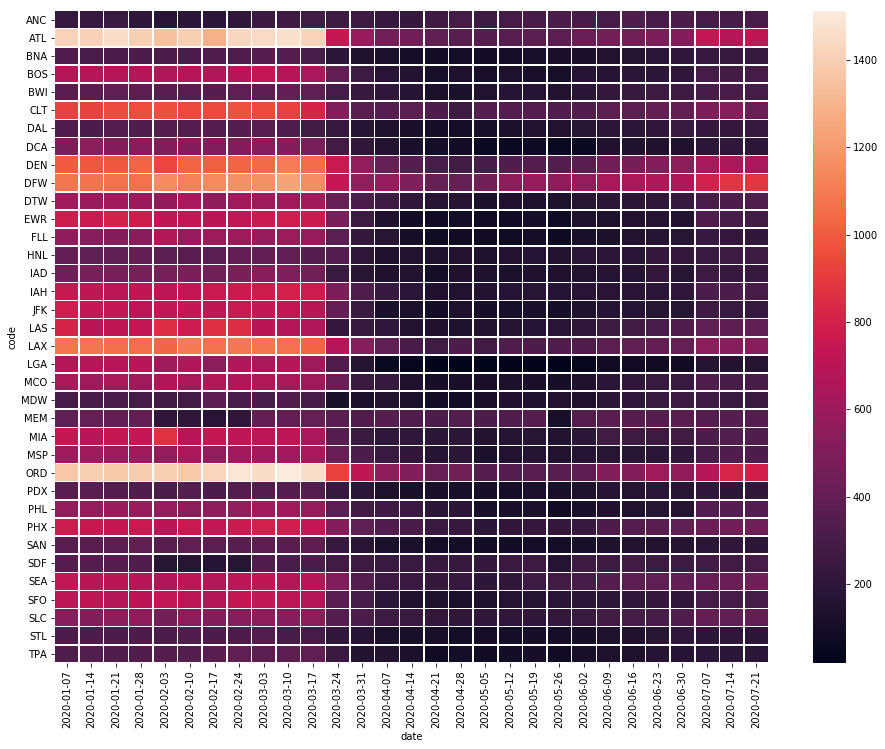

In [20]:
us_city_pivot = US_df.pivot("code", "date", "Total")
f, ax = plt.subplots(figsize=(16, 12))
sns.heatmap(us_city_pivot, linewidths=.5, ax=ax)

In [21]:
EUR_df = cntry_date_df.loc[cntry_date_df['country'].isin(['Spain','Italy','Germany','France','United Kingdom'])]
EUR_df.head()

,country,date,Total
2719,Italy,2020-01-07,1819
1868,France,2020-01-07,2164
4969,Spain,2020-01-07,2321
2018,Germany,2020-01-07,2699
5563,United Kingdom,2020-01-07,2818


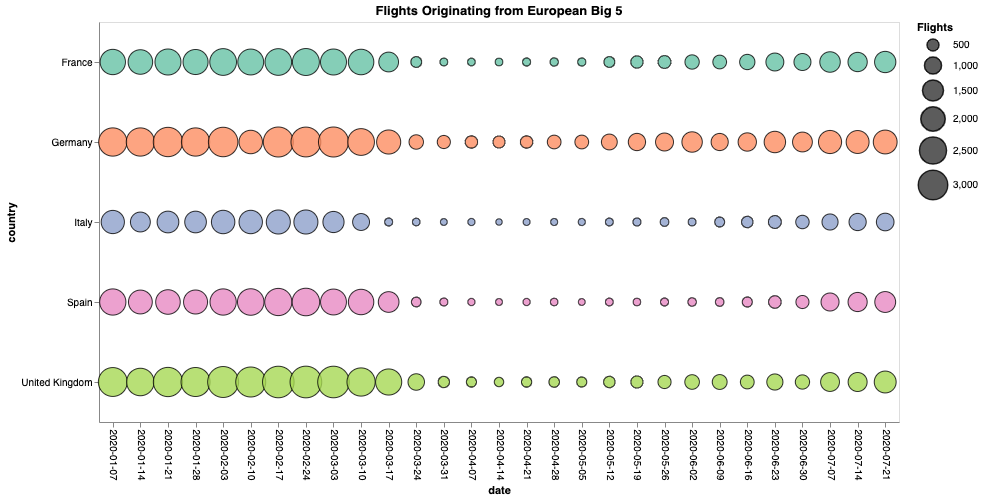

In [22]:
alt.Chart(EUR_df).mark_circle(
    opacity=0.8,
    stroke='black',
    strokeWidth=1
).encode(
    alt.X('date:O', axis=alt.Axis(labelAngle=90)),
    alt.Y('country:N'),
    alt.Size('Total:Q',
        scale=alt.Scale(range=[0, 1000]),
        legend=alt.Legend(title='Flights')
    ),
    alt.Color('country', scale=alt.Scale(scheme='set2'),legend=None)
).properties(
    width=800,
    height=400,
    title='Flights Originating from European Big 5'
)


In [23]:
cntry_df = pd.merge(full, airports, left_on='schd_to', right_on='code')
cntry_df.rename(columns={"country": "to_country", "code": "to_code", "latitude": "to_latitude", "longitude":"to_longitude"}, inplace = True)
cntry_df = cntry_df[cntry_df['schd_from'] != cntry_df['schd_to']] 
cntry_df.drop(columns=['schd_from','schd_to','to_code','from_code','name_x','name_y','from_latitude',
                       'from_longitude','to_latitude','to_longitude'],inplace=True)
to_cntry_df = cntry_df.groupby(['to_country','date'])[['Total']].agg('sum').reset_index()
frm_cntry_df = cntry_df.groupby(['from_country','date'])[['Total']].agg('sum').reset_index()
to_cntry_df = to_cntry_df.loc[(to_cntry_df['to_country'].isin(['United States','China','India']))]
frm_cntry_df = frm_cntry_df.loc[(frm_cntry_df['from_country'].isin(['United States','China','India']))]
to_cntry_df = to_cntry_df.pivot(index ='date', columns ='to_country', values =['Total'])
frm_cntry_df = frm_cntry_df.pivot(index ='date', columns ='from_country', values =['Total'])
cntry_df = pd.merge(frm_cntry_df, to_cntry_df, left_on='date', right_on='date')
cntry_df.rename(columns = {'Total_x':'To','Total_y':'From'}, level = 0, inplace=True)
#cntry_df.columns.set_levels([['T_x','T_y'],['to_china', 'to_ind', 'to_us', 'frm_china', 'frm_ind','frm_us']], inplace=True)
cntry_df.columns = cntry_df.columns.map('_'.join)
cntry_df.reset_index(level=0, inplace=True)
cntry_df_tr = cntry_df.reset_index().melt(['date','index'])

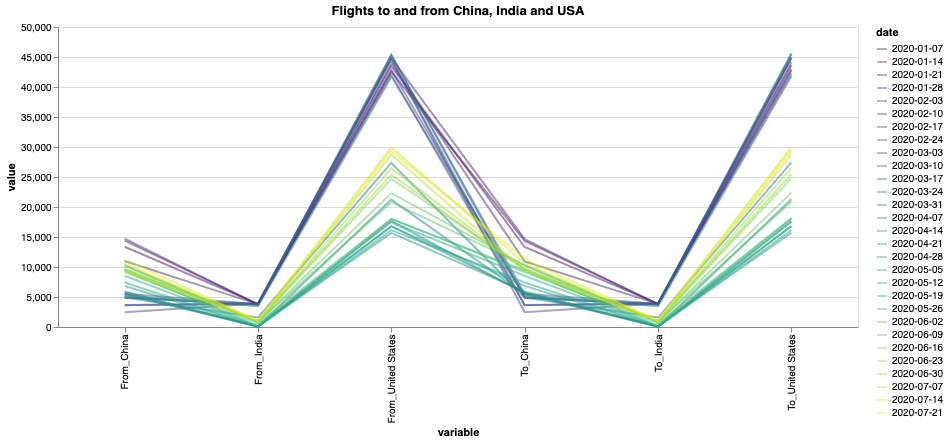

In [24]:
chart = alt.Chart(cntry_df_tr).mark_line().encode(
    x='variable:N',
    y='value:Q',
    color=alt.Color('date', scale=alt.Scale(scheme='viridis')),
    detail='index:N',
    opacity=alt.value(0.5),
).properties(width=800,title='Flights to and from China, India and USA')
chart

In [25]:
US_df.head()

,code,date,Total
734,ORD,2020-03-10,1513
732,ORD,2020-02-24,1491
38,ATL,2020-03-10,1468
31,ATL,2020-01-21,1458
735,ORD,2020-03-17,1456


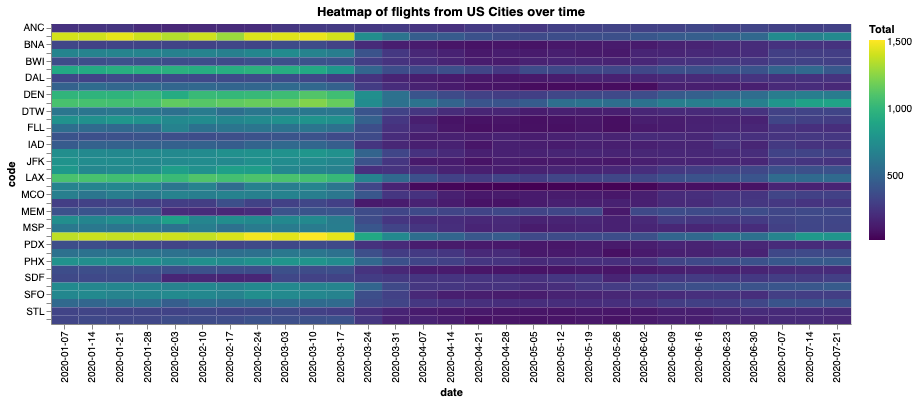

In [26]:
alt.Chart(US_df).mark_rect().encode(
    x='date:O',
    y='code:O',
    color=alt.Color('Total', scale=alt.Scale(scheme='viridis'))
).properties(width=800,title='Heatmap of flights from US Cities over time')

In [27]:
final_start_end = final[final['schd_from'] == final['schd_to']] 
final_start_end_cntry = final_start_end.groupby(['from_country','date'])[['Total']].agg('sum').reset_index()
final_start_end_US_city = final_start_end[final_start_end['from_country']=='United States']
us_cities = np.sort(US_df.code.unique())
final_start_end_US_city = final_start_end_US_city[final_start_end_US_city['schd_from'].isin(us_cities)]
final_start_end_US_city = final_start_end_US_city.groupby(['schd_from','date'])[['Total']].agg('sum').reset_index()
final_start_end_reduced = final_start_end_cntry[final_start_end_cntry['from_country'] != 'United States']
cntry_counts = final_start_end_reduced['from_country'].value_counts()
cntry_list = cntry_counts[cntry_counts > 25].index.tolist()
final_start_end_reduced = final_start_end_reduced[final_start_end_reduced['from_country'].isin(cntry_list)]

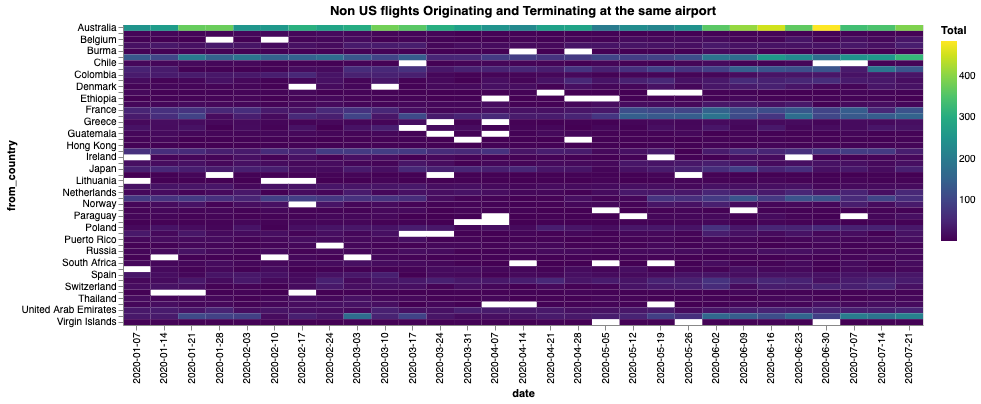

In [28]:
alt.Chart(final_start_end_reduced).mark_rect().encode(
    x='date:O',
    y='from_country:O',
    color=alt.Color('Total', scale=alt.Scale(scheme='viridis'))
).properties(width=800,title='Non US flights Originating and Terminating at the same airport')

Text(0.5,1,'Flights originating and Terminating at the same US City Airport')

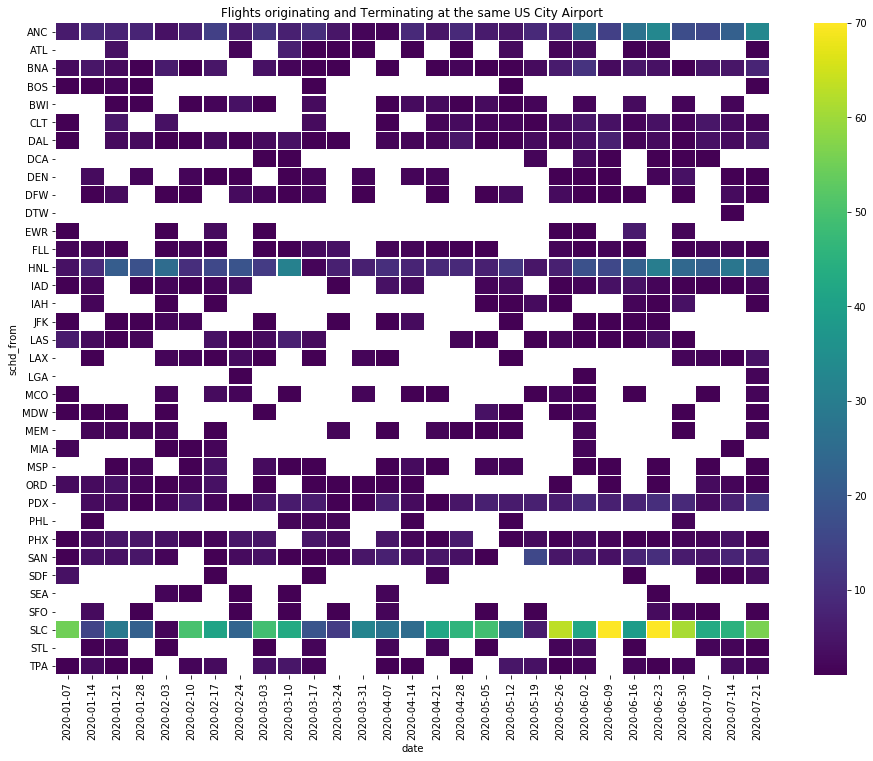

In [29]:

# 
f, ax = plt.subplots(figsize=(16, 12))
flights_local = final_start_end_US_city.pivot("schd_from", "date", "Total")
sns.heatmap(flights_local, linewidths=.5, ax=ax, cmap='viridis')
plt.title("Flights originating and Terminating at the same US City Airport")





In [30]:
oz_df = final[final['from_country']=='Australia']
oz_df = oz_df[oz_df['schd_from'].isin(['SYD','MBW','PAL','MEL','JAD','BWU','BNE','PER','ACF','ADL'])]
oz_df = oz_df.groupby(['schd_from','date'])[['Total']].agg('sum').reset_index()

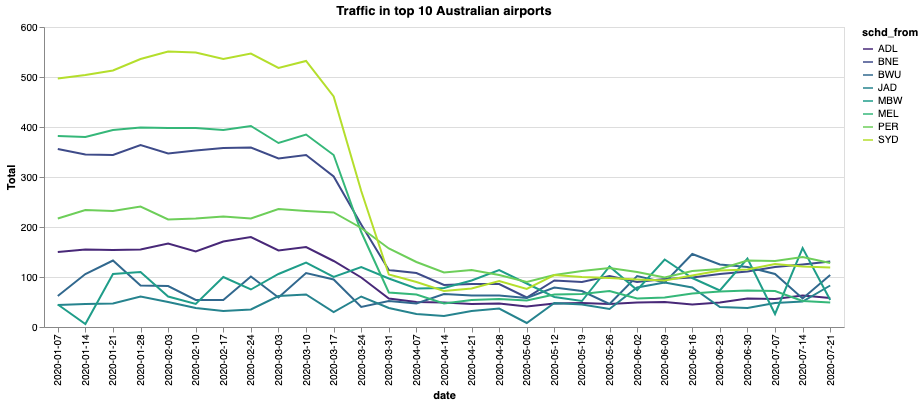

In [31]:
alt.Chart(oz_df).mark_line().encode(
    x='date',
    y='Total',
    color=alt.Color('schd_from', scale=alt.Scale(scheme='viridis'))
).properties(width=800,title='Traffic in top 10 Australian airports')

In [32]:
asia_df = final[final['from_country'].isin(['India','China','Japan','South Korea','Iran','Indonesia','Malayasia','Singapore','Taiwan','UAE'])]
asia_df = asia_df.groupby(['from_country','date'])[['Total']].agg('sum').reset_index()

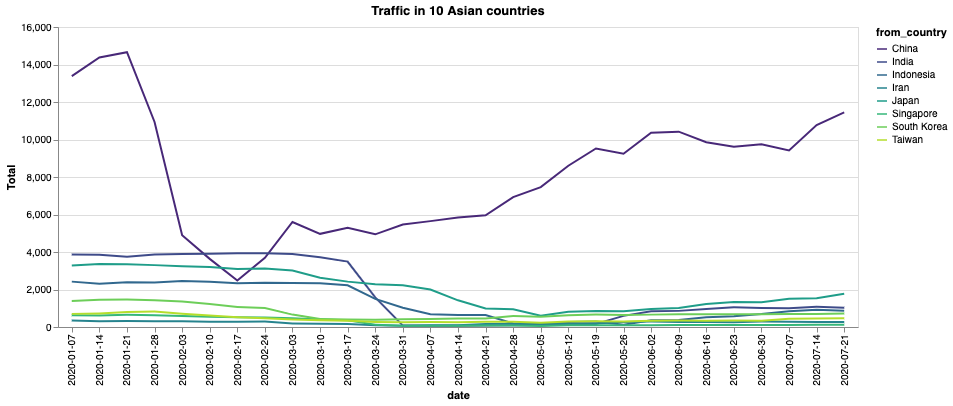

In [33]:
alt.Chart(asia_df).mark_line().encode(
    x='date',
    y='Total',
    color=alt.Color('from_country', scale=alt.Scale(scheme='viridis'))
).properties(width=800,title='Traffic in 10 Asian countries')

# Create Flight Path maps

In [34]:
# add date field to date value for filtering purpose
flight_df['date_ts'] = pd.to_datetime(flight_df['date'].str.strip(), format='%Y-%m-%d')

/Users/user/anaconda3/envs/dviz/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [35]:
# cutoff_date = pd.to_datetime('2020-06-16')
# # Filter out after cutoff date
# flight_df = flight_df[flight_df['date_ts']<cutoff_date]

In [36]:
# creae list of dates to iterate through
dates = np.sort(flight_df.date.unique())

In [37]:
%%time
#### This is for only up to June 9th


fnt = ImageFont.truetype("Library/Fonts/Arial.ttf", 70)
fnt_small = ImageFont.truetype("Library/Fonts/Arial.ttf", 50)
start = ""
x = 0
y = 1650
p_week = ""

# initializing GCMapper and set data
#grad = Gradient(((0, 0, 0, 0),(.4, 30,144,255),(.7, 65,105,225), (1, 0, 0, 255)))
# grad = Gradient(((0, 0, 0, 0), (0.5, 0, 0, 255), (1, 255, 204, 230)))  # Black with blue lins
# grad = Gradient(((0, 60, 65, 72), (0.9, 117, 134, 169), (1, 227, 230, 237)))  # Black with blue lins
grad = Gradient(((0, 60, 65, 72), (0.4, 0, 128, 255), (1, 227, 230, 237)))  # Black with blue lins
# grad = Gradient(((0, 227, 230, 237),(0.5, 117, 134, 169), (1, 25, 54, 111))) 
# grad = Gradient(((0, 227, 230, 237),(0.5, 70, 94, 139), (1, 228, 73, 73))) 
# grad = Gradient(((0, 227, 230, 237),(.5, 21, 127, 255), (1, 10, 15, 25))) 

for date in dates:
# for date in dates_short:
    df_flight_paths = flight_df[flight_df['date'] == date]
    df_flight_paths = df_flight_paths.reset_index()
#     gcm = GCMapper(cols=grad, height=2000, width=4000,bgcol=(6,8,10), proj = 'robin') # Black
    gcm = GCMapper(cols=grad, height=2000, width=4000,bgcol=(6,8,10)) # Black
#     gcm = GCMapper(cols=grad, height=2000, width=4000,bgcol=(0,0,0)) # Black
#     gcm = GCMapper(cols=grad, height=2000, width=4000,bgcol=(130,150,160)) # light gray
#     gcm = GCMapper(cols=grad, height=2000, width=4000,bgcol=(245,246,247)) # White blue tint
    gcm.set_data(df_flight_paths['from_longitude'], df_flight_paths['from_latitude'], df_flight_paths['to_longitude'],
             df_flight_paths['to_latitude'], df_flight_paths['Total'])
    img = gcm.draw()
    
    total = sum(df_flight_paths['Total'])
    try:
        p_week = (total-p_week)/p_week
    except:
        p_week = 0
        
    
    j = pd.to_datetime(date).month_name()
    k = str(pd.to_datetime(date).date())
    if start != j:
        start = j
#         x += 550 ## June 09
        x += 500 ## July 21
        w = x - (len(str(k))*35)/2 
#         z = x - (len(start)*20)/2  ## June 09
        z = x - (len(start)*35)/2  ## July 21

    
    # get a drawing context
    d = ImageDraw.Draw(img)
     
    # draw Months and Line
    
    fill_collor = (227,230,237,255)
#     (25,54,111,255)
#     (10,15,25,255)
#     (21,127,255,255)
#     (25,54,111,255)
#     (0,0,255,255)
    

    # Total Flights
    d.text((3000,100), 'Total Daily Flights: {:,}'.format(total), font=fnt, fill=fill_collor)
    d.text((3000,200), '% Change WoW: {:0.0%}'.format(p_week), font=fnt_small, fill=fill_collor)
    
    # Month
    d.text((z,y), j, font=fnt, fill=fill_collor)
    

    # Date value
#     d.text((z-50,y+200), str(k), font=fnt, fill=fill_collor) ## June 09
    d.text((w,y+200), str(k), font=fnt, fill=fill_collor)  ## July 21
    
    
    # Line
#     d.line((350, 1800) + (3650, 1800), fill=fill_collor, width = 5) ## June 09
    d.line((250, 1800) + (3750, 1800), fill=fill_collor, width = 5)  ## July 21
 


    # draw hashes Line
    ## June 09
#     d.line((350, 1780) + (350, 1820), fill=fill_collor, width = 5)
#     d.line((900, 1780) + (900, 1820), fill=fill_collor, width = 5)
#     d.line((1450, 1780) + (1450, 1820), fill=fill_collor, width = 5)
#     d.line((2000, 1780) + (2000, 1820), fill=fill_collor, width = 5)
#     d.line((2550, 1780) + (2550, 1820), fill=fill_collor, width = 5)
#     d.line((3100, 1780) + (3100, 1820), fill=fill_collor, width = 5)
#     d.line((3650, 1780) + (3650, 1820), fill=fill_collor, width = 5)
    
    ## July 21
    d.line((250, 1780) + (250, 1820), fill=fill_collor, width = 5)
    d.line((750, 1780) + (750, 1820), fill=fill_collor, width = 5)
    d.line((1250, 1780) + (1250, 1820), fill=fill_collor, width = 5)
    d.line((1750, 1780) + (1750, 1820), fill=fill_collor, width = 5)
    d.line((2250, 1780) + (2250, 1820), fill=fill_collor, width = 5)
    d.line((2750, 1780) + (2750, 1820), fill=fill_collor, width = 5)
    d.line((3250, 1780) + (3250, 1820), fill=fill_collor, width = 5)
    d.line((3750, 1780) + (3750, 1820), fill=fill_collor, width = 5)
    
    p_week = total
    
    img.save("images/flight_"+str(date)+".png")
    print(date)
#     img.show()

2020-01-07
2020-01-14
2020-01-21
2020-01-28
2020-02-03
2020-02-10
2020-02-17
2020-02-24
2020-03-03
2020-03-10
2020-03-17
2020-03-24
2020-03-31
2020-04-07
2020-04-14
2020-04-21
2020-04-28
2020-05-05
2020-05-12
2020-05-19
2020-05-26
2020-06-02
2020-06-09
2020-06-16
2020-06-23
2020-06-30
2020-07-07
2020-07-14
2020-07-21
CPU times: user 4min 33s, sys: 982 ms, total: 4min 34s
Wall time: 4min 35s


In [38]:
image_folder='images'

fps=1

In [39]:
%%time
%%capture
image_files = [image_folder+'/'+img for img in os.listdir(image_folder) if img.endswith(".png")]
clip = moviepy.video.io.ImageSequenceClip.ImageSequenceClip(image_files, fps=fps)
clip.write_videofile('images/flights.mp4')


CPU times: user 7.57 s, sys: 777 ms, total: 8.34 s
Wall time: 13.9 s


In [40]:
%%HTML
<Video width="960" height="720" controls>
  <source src="images/flights.mp4" type="video/mp4">
</Video>